In [1]:
#!pip install tensorflow[and-cuda]==2.12.0rc0
## You need to restart the session after first installation
!pip install tensorflow==2.12.0rc0
!pip install tensorflow-addons==0.20.0
!pip install skillsnetwork==0.20.6
!pip install pydot
!pip install wrapt==1.14.1

  Using cached tensorflow_addons-0.20.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached typeguard-2.13.3-py3-none-any.whl.metadata (3.6 kB)
Using cached tensorflow_addons-0.20.0-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (591 kB)
Using cached typeguard-2.13.3-py3-none-any.whl (17 kB)
  Attempting uninstall: typeguard
    Found existing installation: typeguard 4.4.2
    Uninstalling typeguard-4.4.2:
      Successfully uninstalled typeguard-4.4.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inflect 7.5.0 requires typeguard>=4.0.1, but you have typeguard 2.13.3 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 33.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 7.4 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrap

In [ ]:
#!pip install skillsnetwork==0.20.6

In [ ]:
#!pip install tensorflow-addons==0.20.0

In [2]:
!pip show tensorflow

Name: tensorflow
Version: 2.12.0rc0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.11/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, jax, keras, libclang, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: dopamine_rl, tensorflow-text, tensorflow_decision_forests, tf_keras


In [3]:
!pip show keras

Name: keras
Version: 2.12.0
Summary: Deep learning for humans.
Home-page: https://keras.io/
Author: Keras team
Author-email: keras-users@googlegroups.com
License: Apache 2.0
Location: /usr/local/lib/python3.11/dist-packages
Requires: 
Required-by: tensorflow


In [4]:
import warnings
warnings.simplefilter('ignore')

import keras
from tensorflow.keras.utils import plot_model
import numpy as np
import tensorflow as tf
print(f"tensorflow version: {tf.__version__}")
import tensorflow_addons as tfa

from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input,Conv2DTranspose,BatchNormalization,ReLU,Conv2D,LeakyReLU


from IPython import display

tensorflow version: 2.12.0-rc0


In [5]:
import skillsnetwork
print(f"skillsnetwork version: {skillsnetwork.__version__}")
import matplotlib.pyplot as plt

%matplotlib inline


import os
from os import listdir
from pathlib import Path
import imghdr

import time
from tqdm.auto import tqdm
import time
from PIL import Image
import random

skillsnetwork version: 0.20.6


In [6]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()
print('Number of devices: {}'.format(strategy.num_replicas_in_sync))

print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE

print(tf.__version__)

Number of devices: 1
Number of replicas: 1
2.12.0-rc0


In [7]:
def decode_image(file_path):

    """
    return a decoded tf tensor given an image file path,

    """
    image = tf.io.read_file(file_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image


def load_dataset(directory, labeled=True):

    """
    return a tf.data.Dataset consisting of images from directory, decoded by the function decode_image

    """
    dataset = tf.data.Dataset.list_files(directory + "/*.jpg")
    dataset = dataset.map(decode_image, num_parallel_calls=AUTOTUNE)

    return dataset

In [8]:
await skillsnetwork.prepare("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0KSEEN/data/gan_getting_started_300.zip", overwrite=True)

  0%|          | 0/605 [00:00<?, ?it/s]

Saved to '.'


In [9]:
IMG_PATH = "gan_getting_started_300"

MONET_FILENAMES = tf.io.gfile.glob(str(IMG_PATH + '/monet_jpg_300/*.jpg'))
print('Monet JPG Files:', len(MONET_FILENAMES))

PHOTO_FILENAMES = tf.io.gfile.glob(str(IMG_PATH + '/photo_jpg_300/*.jpg'))
print('Photo JPG Files:', len(PHOTO_FILENAMES))

Monet JPG Files: 300
Photo JPG Files: 300


In [10]:
IMAGE_SIZE = [256, 256]

monet_ds = load_dataset("gan_getting_started_300/monet_jpg_300", labeled=True).batch(1)
photo_ds = load_dataset("gan_getting_started_300/photo_jpg_300", labeled=True).batch(1)

monet_ds, photo_ds

(<_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>,
 <_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>)

In [11]:
example_monet = next(iter(monet_ds))
example_photo = next(iter(photo_ds))

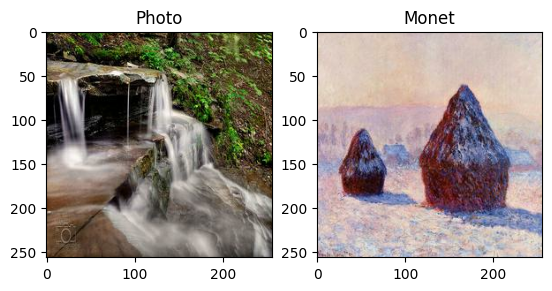

In [12]:
plt.subplot(121)
plt.title('Photo')
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Monet')
plt.imshow(example_monet[0] * 0.5 + 0.5)

In [13]:
OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_instancenorm=True):

    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

    if apply_instancenorm:
        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    result.add(layers.LeakyReLU())

    return result

In [14]:
def upsample(filters, size, apply_dropout=False):

    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    result = keras.Sequential()
    result.add(layers.Conv2DTranspose(filters, size, strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      use_bias=False))

    result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

    if apply_dropout:
        result.add(layers.Dropout(0.5))

    result.add(layers.ReLU())

    return result

In [15]:
def Generator():
    inputs = layers.Input(shape=[256,256,3])

    # bs = batch size
    down_stack = [
        downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
        downsample(128, 4), # (bs, 64, 64, 128)
        downsample(256, 4), # (bs, 32, 32, 256)
        downsample(512, 4), # (bs, 16, 16, 512)
        downsample(512, 4), # (bs, 8, 8, 512)
        downsample(512, 4), # (bs, 4, 4, 512)
        downsample(512, 4), # (bs, 2, 2, 512)
        downsample(512, 4), # (bs, 1, 1, 512)
    ]

    up_stack = [
        upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
        upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
        upsample(512, 4), # (bs, 16, 16, 1024)
        upsample(256, 4), # (bs, 32, 32, 512)
        upsample(128, 4), # (bs, 64, 64, 256)
        upsample(64, 4), # (bs, 128, 128, 128)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                  strides=2,
                                  padding='same',
                                  kernel_initializer=initializer,
                                  activation='tanh') # (bs, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)

    return keras.Model(inputs=inputs, outputs=x)

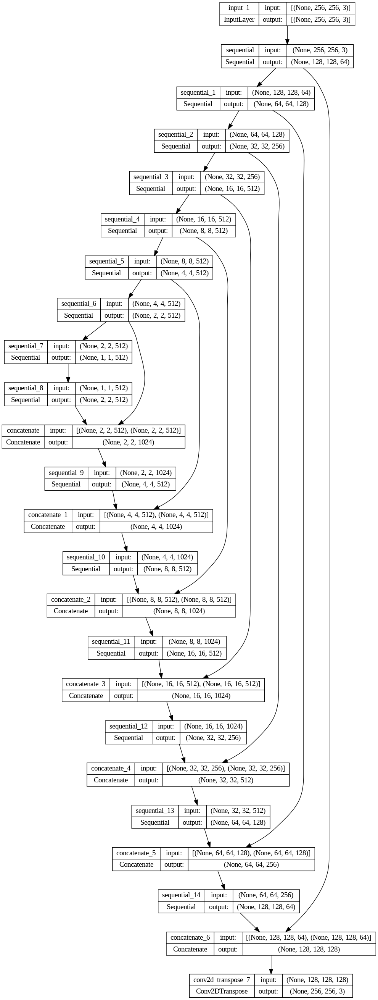

In [16]:
gen = Generator()
plot_model(gen, show_shapes=True, show_layer_names=True)

In [17]:
def Discriminator():

    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inp = layers.Input(shape=[256, 256, 3], name='input_image')

    x = inp

    down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
    down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
    down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

    zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
    conv = layers.Conv2D(512, 4, strides=1,
                         kernel_initializer=initializer,
                         use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)

    leaky_relu = layers.LeakyReLU()(norm1)

    zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

    last = layers.Conv2D(1, 4, strides=1,
                         kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

    return tf.keras.Model(inputs=inp, outputs=last)

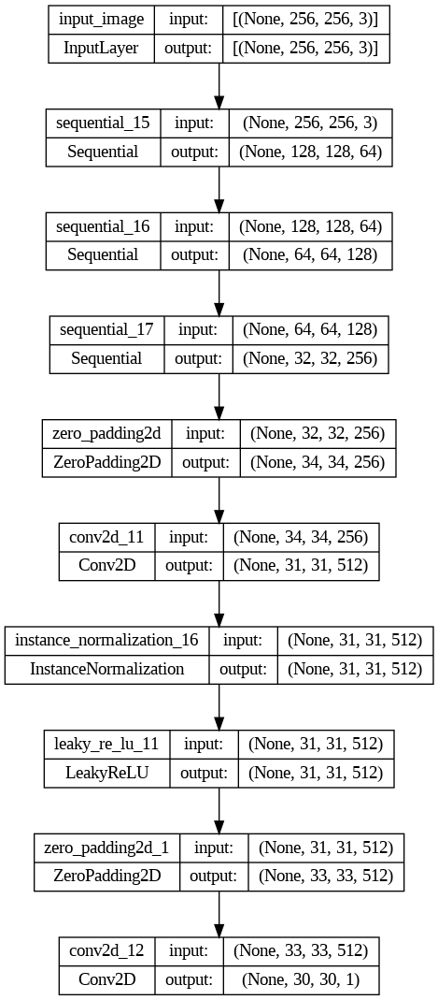

In [18]:
disc = Discriminator()
plot_model(disc, show_shapes=True, show_layer_names=True)

In [19]:
with strategy.scope():

    monet_generator = Generator() # transforms photos to Monet-esque paintings
    photo_generator = Generator() # transforms Monet paintings to be more like photos

    monet_discriminator = Discriminator() # differentiates real Monet paintings and generated Monet paintings
    photo_discriminator = Discriminator() # differentiates real photos and generated photos

In [20]:
class CycleGan(keras.Model):

    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
        lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle

    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn


    @tf.function
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data

        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.m_gen.trainable_variables))

        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.p_gen.trainable_variables))

        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.m_disc.trainable_variables))

        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.p_disc.trainable_variables))

        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [21]:
with strategy.scope():

    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)

        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)

        total_disc_loss = real_loss + generated_loss

        return total_disc_loss * 0.5

In [22]:
with strategy.scope():

    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True,
                                    reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated),generated)

In [23]:
#We want our original photo and the twice transformed photo to be similar to one another.
#Thus, we can calculate the cycle consistency loss be finding the average of their difference.

with strategy.scope():

    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

        return LAMBDA * loss1

In [24]:
with strategy.scope():

    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

In [25]:
with strategy.scope():

    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [26]:
with strategy.scope():

    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

In [ ]:
history = cycle_gan_model.fit(
     tf.data.Dataset.zip((monet_ds, photo_ds)),
     epochs=50)

Epoch 1/50
300/300 [==============================] - 3502s 12s/step - monet_gen_loss: 5.2195 - photo_gen_loss: 5.2977 - monet_disc_loss: 0.6299 - photo_disc_loss: 0.6375
Epoch 2/50
300/300 [==============================] - 3449s 11s/step - monet_gen_loss: 3.6841 - photo_gen_loss: 3.7230 - monet_disc_loss: 0.6488 - photo_disc_loss: 0.6351
Epoch 3/50
239/300 [======================>.......] - ETA: 11:44 - monet_gen_loss: 3.5945 - photo_gen_loss: 3.6752 - monet_disc_loss: 0.6690 - photo_disc_loss: 0.6197

KeyboardInterrupt: 

In [27]:
await skillsnetwork.prepare("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-ML311-Coursera/LargeData/monet_generator_50_epochs.tgz",
                           overwrite=True)

  0%|          | 0/14 [00:00<?, ?it/s]

Saved to '.'


In [28]:
monet_generator_model = tf.keras.models.load_model("monet_generator_50_epochs")

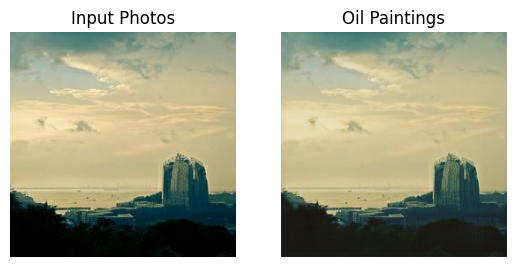

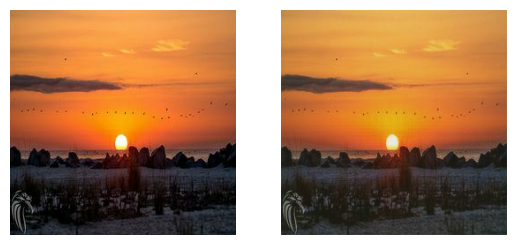

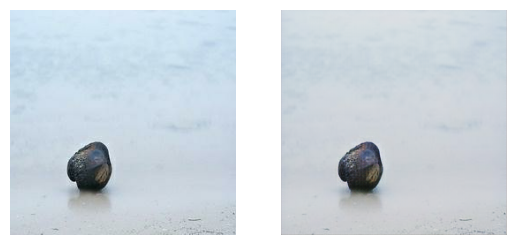

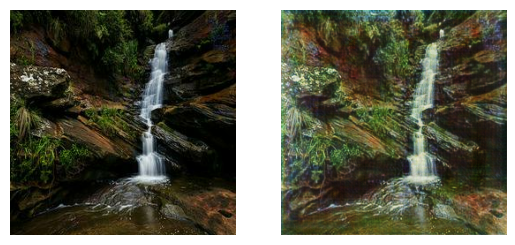

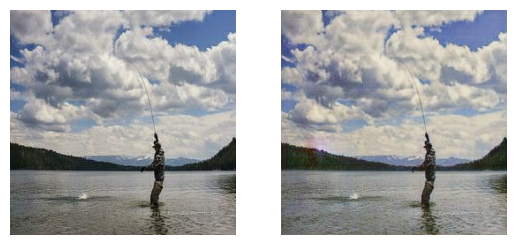

...

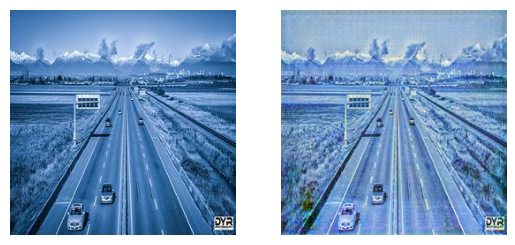

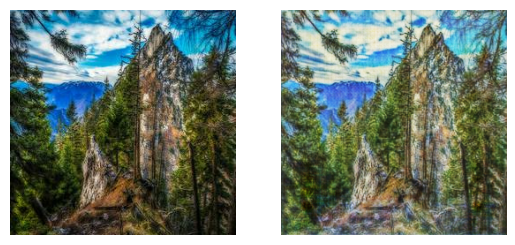

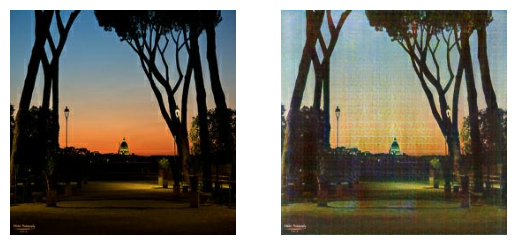

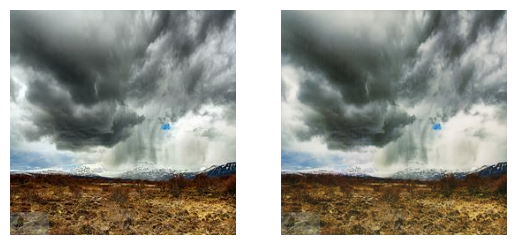

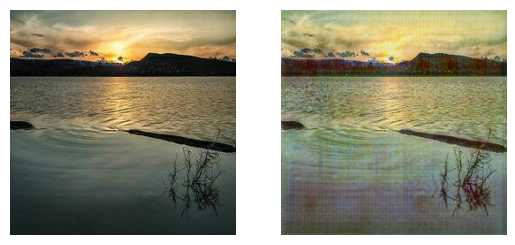

In [29]:
import cv2
for i in range(15):

    # randomly draw a photo from PHOTO_FILENAMES
    rand_ind = random.randint(0,299)
    img_path = PHOTO_FILENAMES[rand_ind]
    img = decode_image(img_path)
    img = tf.expand_dims(img, axis=0)

    prediction = monet_generator_model(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    fig = plt.figure()
    fig.add_subplot(1,2,1)
    if i == 0:
        plt.title("Input Photos")
    plt.imshow(img)
    plt.axis("off")
    orgname=f"Original_image_{i}.jpg"
    imgname=f"Oil_Painting_{i}.jpg"
    cv2.imwrite(orgname,img)
    cv2.imwrite(imgname,prediction)

    fig.add_subplot(1,2,2)
    if i == 0:
        plt.title("Oil Paintings")
    plt.imshow(prediction)
    plt.axis("off")

In [30]:
import platform

%pip install -q "openvino>=2023.1.0"
%pip install -q opencv-python
%pip install -q pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 MB 21.9 MB/s eta 0:00:00


In [31]:
import os
import time
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML, FileLink
from IPython.display import Image as DisplayImage
from IPython.display import Pretty, ProgressBar, clear_output, display
from PIL import Image
import openvino as ov

In [32]:
import ipywidgets as widgets

core = ov.Core()
device = widgets.Dropdown(
    options=core.available_devices + ["AUTO"],
    value='AUTO',
    description='Device:',
    disabled=False,
)

device

Dropdown(description='Device:', index=1, options=('CPU', 'AUTO'), value='AUTO')

In [33]:
def download_file(url: str, path: Path) -> None:
    """Download file."""
    import urllib.request
    path.parent.mkdir(parents=True, exist_ok=True)
    urllib.request.urlretrieve(url, path)

In [34]:
# 1032: 4x superresolution, 1033: 3x superresolution
model_name = 'single-image-super-resolution-1032'

base_model_dir = Path("./model").expanduser()

model_xml_name = f'{model_name}.xml'
model_bin_name = f'{model_name}.bin'

model_xml_path = base_model_dir / model_xml_name
model_bin_path = base_model_dir / model_bin_name

if not model_xml_path.exists():
    base_url = f'https://storage.openvinotoolkit.org/repositories/open_model_zoo/2023.0/models_bin/1/{model_name}/FP16/'
    model_xml_url = base_url + model_xml_name
    model_bin_url = base_url + model_bin_name

    download_file(model_xml_url, model_xml_path)
    download_file(model_bin_url, model_bin_path)
else:
    print(f'{model_name} already downloaded to {base_model_dir}')

In [35]:
def write_text_on_image(image: np.ndarray, text: str) -> np.ndarray:
    """
    Write the specified text in the top left corner of the image
    as white text with a black border.

    :param image: image as numpy arry with HWC shape, RGB or BGR
    :param text: text to write
    :return: image with written text, as numpy array
    """
    font = cv2.FONT_HERSHEY_PLAIN
    org = (20, 20)
    font_scale = 4
    font_color = (255, 255, 255)
    line_type = 1
    font_thickness = 2
    text_color_bg = (0, 0, 0)
    x, y = org

    image = cv2.UMat(image)
    (text_w, text_h), _ = cv2.getTextSize(text, font, font_scale, font_thickness)
    result_im = cv2.rectangle(image, org, (x + text_w, y + text_h), text_color_bg, -1)

    textim = cv2.putText(
        result_im,
        text,
        (x, y + text_h + font_scale - 1),
        font,
        font_scale,
        font_color,
        font_thickness,
        line_type,
    )
    return textim.get()


def convert_result_to_image(result) -> np.ndarray:
    """
    Convert network result of floating point numbers to image with integer
    values from 0-255. Values outside this range are clipped to 0 and 255.

    :param result: a single superresolution network result in N,C,H,W shape
    """
    result = result.squeeze(0).transpose(1, 2, 0)
    result *= 255
    result[result < 0] = 0
    result[result > 255] = 255
    result = result.astype(np.uint8)
    return result


def to_rgb(image_data) -> np.ndarray:
    """
    Convert image_data from BGR to RGB
    """
    return cv2.cvtColor(image_data, cv2.COLOR_BGR2RGB)

In [36]:
core = ov.Core()
model = core.read_model(model=model_xml_path)
compiled_model = core.compile_model(model=model, device_name=device.value)

# Network inputs and outputs are dictionaries. Get the keys for the
# dictionaries.
original_image_key, bicubic_image_key = compiled_model.inputs
output_key = compiled_model.output(0)

# Get the expected input and target shape. The `.dims[2:]` returns the height
# and width. The `resize` function of OpenCV expects the shape as (width, height),
# so reverse the shape with `[::-1]` and convert it to a tuple.
input_height, input_width = list(original_image_key.shape)[2:]
target_height, target_width = list(bicubic_image_key.shape)[2:]

upsample_factor = int(target_height / input_height)

print(f"The network expects inputs with a width of {input_width}, " f"height of {input_height}")
print(f"The network returns images with a width of {target_width}, " f"height of {target_height}")

print(
    f"The image sides are upsampled by a factor of {upsample_factor}. "
    f"The new image is {upsample_factor**2} times as large as the "
    "original image"
)

The network expects inputs with a width of 480, height of 270
The network returns images with a width of 1920, height of 1080
The image sides are upsampled by a factor of 4. The new image is 16 times as large as the original image


Showing full image with width 256 and height 256


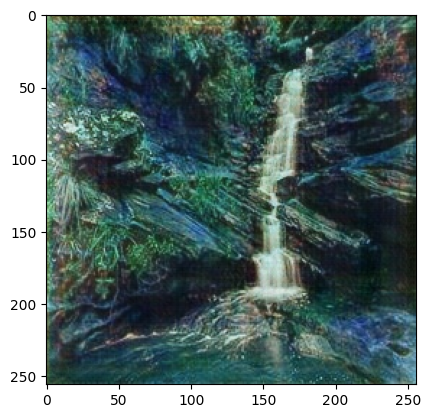

In [37]:
OUTPUT_PATH = Path("output/")

os.makedirs(str(OUTPUT_PATH), exist_ok=True)
serl=3
image_nname=f"Oil_Painting_{serl}.jpg"

full_image = cv2.imread(image_nname)

plt.imshow(to_rgb(full_image))
print(f"Showing full image with width {full_image.shape[1]} " f"and height {full_image.shape[0]}")

In [38]:
# Resize the image to the target shape with bicubic interpolation.
bicubic_image = cv2.resize(
    src=full_image, dsize=(target_width, target_height), interpolation=cv2.INTER_CUBIC
)

# If required, resize the image to the input image shape.
full_image = cv2.resize(src=full_image, dsize=(input_width, input_height))

# Reshape the images from (H,W,C) to (N,C,H,W).
input_image_original = np.expand_dims(full_image.transpose(2, 0, 1), axis=0)
input_image_bicubic = np.expand_dims(bicubic_image.transpose(2, 0, 1), axis=0)

In [39]:
full_image.shape

(270, 480, 3)

In [40]:
result = compiled_model(
    {
        original_image_key.any_name: input_image_original,
        bicubic_image_key.any_name: input_image_bicubic,
    }
)[output_key]

# Get inference result as numpy array and reshape to image shape and data type
result_image = convert_result_to_image(result)

True

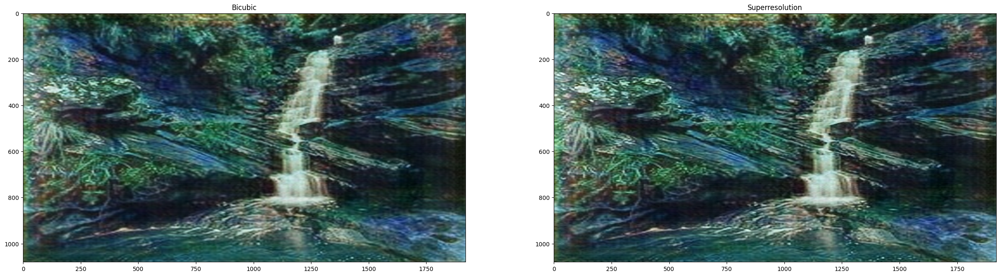

In [41]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(30, 15))
ax[0].imshow(to_rgb(bicubic_image))
ax[1].imshow(to_rgb(result_image))
ax[0].set_title("Bicubic")
ax[1].set_title("Superresolution")
superr=f"OpenVINO_Super_resolution_Oil_paint_{serl}.jpg"
bicubb=f"OpenVINO_Bicubic_resolution_Oil_paint_{serl}.jpg"
cv2.imwrite(superr,to_rgb(result_image))
cv2.imwrite(bicubb,to_rgb(bicubic_image))


In [42]:
!wget https://martin-krasser.de/sisr/weights-article-2.tar.gz

--2025-05-17 12:15:53--  https://martin-krasser.de/sisr/weights-article-2.tar.gz
Resolving martin-krasser.de (martin-krasser.de)... 217.160.0.142, 2001:8d8:100f:f000::209
Connecting to martin-krasser.de (martin-krasser.de)|217.160.0.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15959599 (15M) [application/gzip]
Saving to: ‘weights-article-2.tar.gz’

weights-article-2.t 100%[===================>]  15.22M  8.16MB/s    in 1.9s    

2025-05-17 12:15:55 (8.16 MB/s) - ‘weights-article-2.tar.gz’ saved [15959599/15959599]



In [43]:
!tar -xf weights-article-2.tar.gz

In [44]:
!git clone https://github.com/krasserm/super-resolution.git SuperResolution

Cloning into 'SuperResolution'...
remote: Enumerating objects: 408, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 408 (delta 0), reused 2 (delta 0), pack-reused 405 (from 1)
Receiving objects: 100% (408/408), 48.16 MiB | 14.32 MiB/s, done.
Resolving deltas: 100% (214/214), done.


In [45]:
import os
os.getcwd()
os.chdir('SuperResolution')

In [67]:
import os
import matplotlib.pyplot as plt

from model import resolve_single
from utils import load_image

%matplotlib inline

def resolve_and_plot(model_pre_trained, model_fine_tuned, lr_image_path):
    lr = load_image(lr_image_path)

    sr_pt = resolve_single(model_pre_trained, lr)
    sr_ft = resolve_single(model_fine_tuned, lr)

    plt.figure(figsize=(20, 20))

    model_name = model_pre_trained.name.upper()
    images = [lr, sr_pt, sr_ft]
    titles = ['LR', f'SR ({model_name}, pixel loss)', f'SR ({model_name}, perceptual loss)']
    positions = [1, 3, 4]

    for i, (image, title, position) in enumerate(zip(images, titles, positions)):
        plt.subplot(2, 2, position)
        plt.imshow(image)
        plt.title(title)
        plt.xticks([])
        plt.yticks([])
        print(type(image))
        superr=f"../EDSR_Super_resolution_Oil_paint_{i}.jpg"
        if isinstance(image, np.ndarray):
          print("Numpy")
        else:
          tf.keras.preprocessing.image.save_img(superr,image)
        #cv2.imwrite(superr,image)

weights_dir = 'weights/article'

In [68]:
from model import edsr

In [69]:
edsr_pre_trained = edsr.edsr(scale=4, num_res_blocks=16)
edsr_pre_trained.load_weights('/content/weights/article/weights-edsr-16-x4.h5')

In [70]:
edsr_fine_tuned = edsr.edsr(scale=4, num_res_blocks=16)
edsr_fine_tuned.load_weights(os.path.join(weights_dir, '/content/weights/article/weights-edsr-16-x4-fine-tuned.h5'))

<class 'numpy.ndarray'>
Numpy
<class 'tensorflow.python.framework.ops.EagerTensor'>
<class 'tensorflow.python.framework.ops.EagerTensor'>


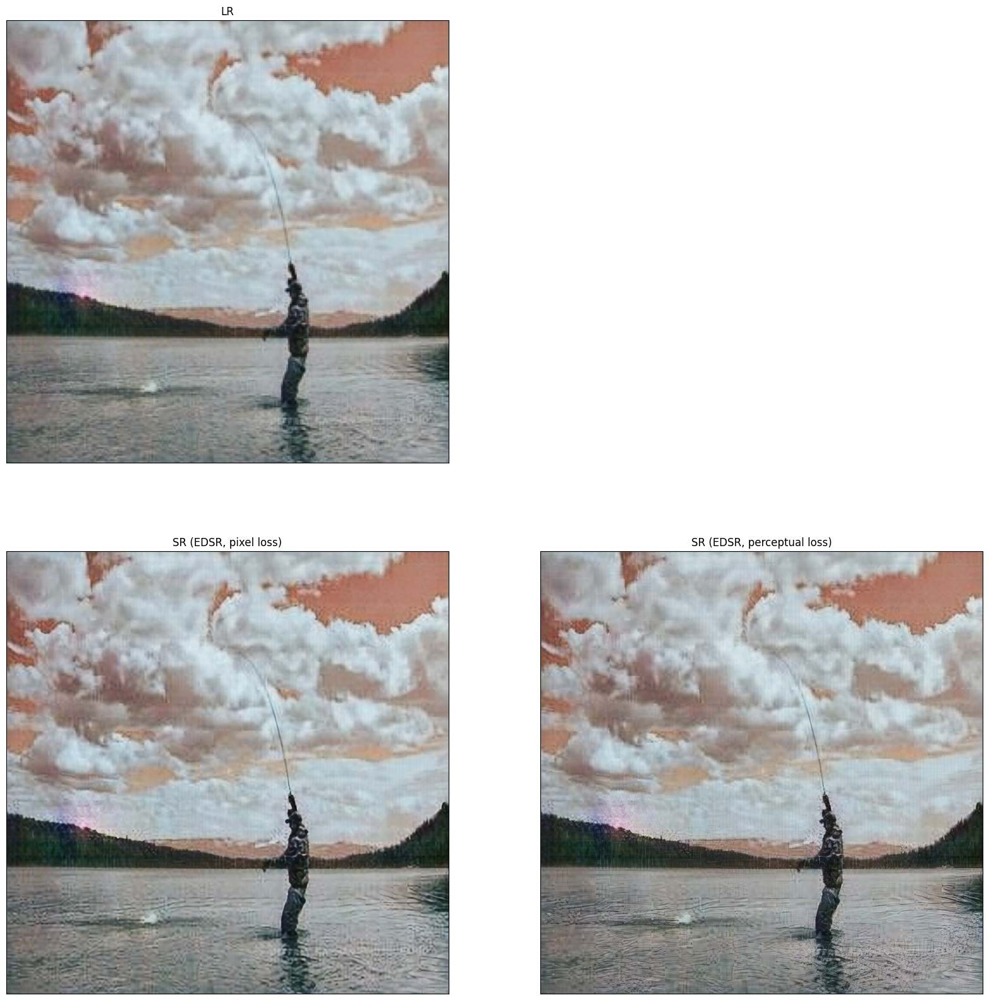

In [71]:
resolve_and_plot(edsr_pre_trained, edsr_fine_tuned, '/content/Oil_Painting_4.jpg')

In [ ]:
/content/Oil_Painting_0.jpg